# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import shutil

import scanpy as sc

from matplotlib.pyplot import rcParams
import matplotlib.pyplot as plt

/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/e

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [4]:
import os
import shutil
import pickle

import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path

from scib_metrics.benchmark import Benchmarker

import drvi
from drvi_notebooks.utils.data.data_configs import get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.method_info import pretify_method_name
from drvi_notebooks.utils.plotting import plot_per_latent_scatter

Merlin is not installed. To use merline dataloader please install it.


In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


# Config

In [7]:
cwd = os.getcwd()

In [8]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [9]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public')

In [10]:
output_dir = proj_dir / 'plots' / 'immune_analysis'
output_dir.mkdir(parents=True, exist_ok=True)
output_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/plots/immune_analysis')

In [11]:
run_name = 'immune_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
var_gene_groups = data_info['var_gene_groups']
cell_type_key = data_info['cell_type_key']
exp_plot_pp = data_info['exp_plot_pp']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Utils

In [13]:
original_params = plt.rcParams.copy()
def set_font_in_rc_params():
    fs = 16
    plt.rcParams.update({
        'font.size': fs,            # General font size
        'axes.titlesize': fs,       # Title font size
        'axes.labelsize': fs,       # Axis label font size
        'legend.fontsize': fs,      # Legend font size
        'xtick.labelsize': fs,      # X-axis tick label font size
        'ytick.labelsize': fs       # Y-axis tick label font size
    })

## Data

In [14]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 32484 × 2000
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    var: 'gene_de_sig', 'mean', 'std'
    uns: 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'lognorm'
    obsp: 'connectivities', 'distances'

## Runs to load

All these runs are created by the scripts in `general` and `baseline` directories. You need to run them first.

In [15]:
run_info = get_run_info_for_dataset('immune_hvg')
RUNS_TO_LOAD = run_info.run_dirs
scatter_point_size = run_info.scatter_point_size
adata_to_transfer_obs = run_info.adata_to_transfer_obs

for k,v in RUNS_TO_LOAD.items():
    if not os.path.exists(v):
        raise ValueError(f"{v} does not exists.")

In [16]:
embeds = {}
random_order = None
for method_name, run_path in RUNS_TO_LOAD.items():
    print(method_name)
    if str(run_path).endswith(".h5ad"):
        embed = sc.read(run_path)
    else:
        embed = sc.read(run_path / 'latent.h5ad')
    pp_function(embed)
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

DRVI
DRVI-IK
scVI
PCA
ICA
MOFA
TCVAE-opt
MICHIGAN-opt
DRVI-CVAE


# Heatmaps for all models

In [17]:
noise_condition = 'no_noise'
metric_results_pkl_address = proj_dir / 'results' / f'eval_disentanglement_fine_metric_results_{run_name}_{noise_condition}.pkl'
with open(metric_results_pkl_address, 'rb') as f:
    metric_results = pickle.load(f)

In [19]:
embed_subset = drvi.utils.pl.make_balanced_subsample(embeds['DRVI'], cell_type_key, min_count=20)
unique_plot_cts = [
    'CD4+ T cells',
    'CD8+ T cells',
    'NK cells',
    'NKT cells',
    'CD10+ B cells',
    'CD20+ B cells',
    'CD14+ Monocytes',
    'CD16+ Monocytes',
    'Plasma cells',
    'Erythrocytes',
    'Erythroid progenitors',
    'Megakaryocyte progenitors',
    'Monocyte progenitors',
    'Monocyte-derived dendritic cells',
    'Plasmacytoid dendritic cells',
    'HSPCs',
]

DRVI


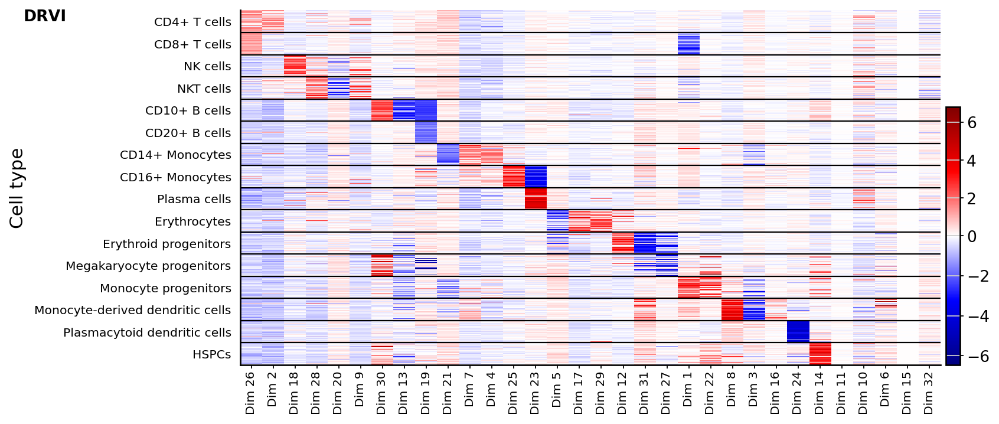

DRVI-IK


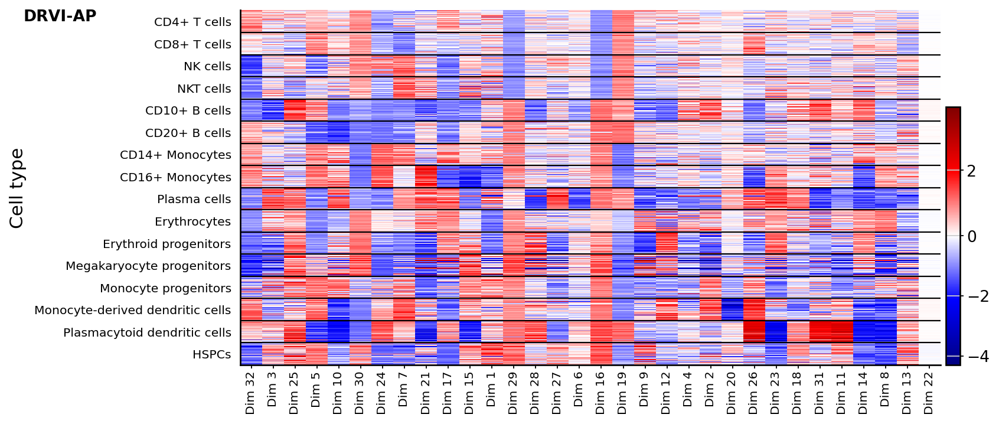

scVI


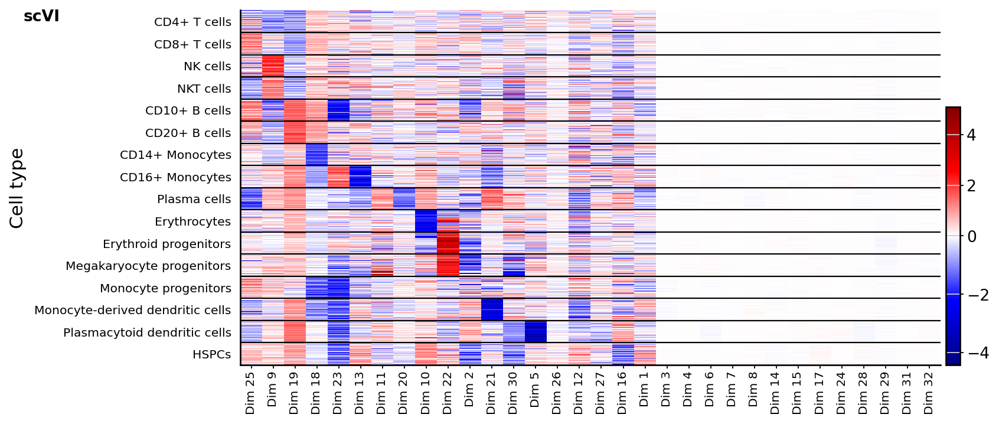

PCA


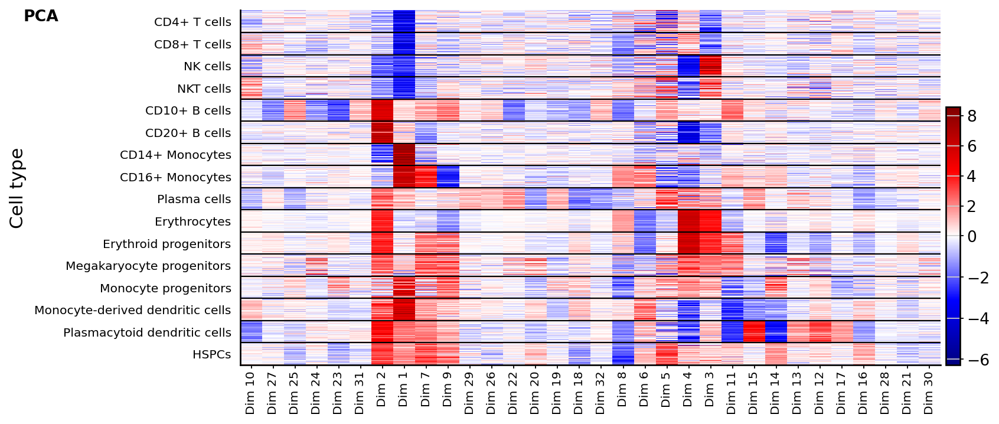

ICA


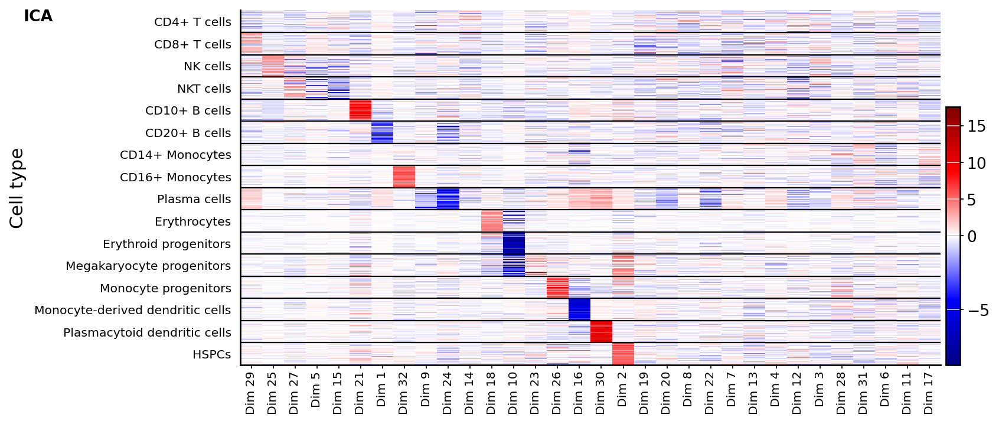

MOFA


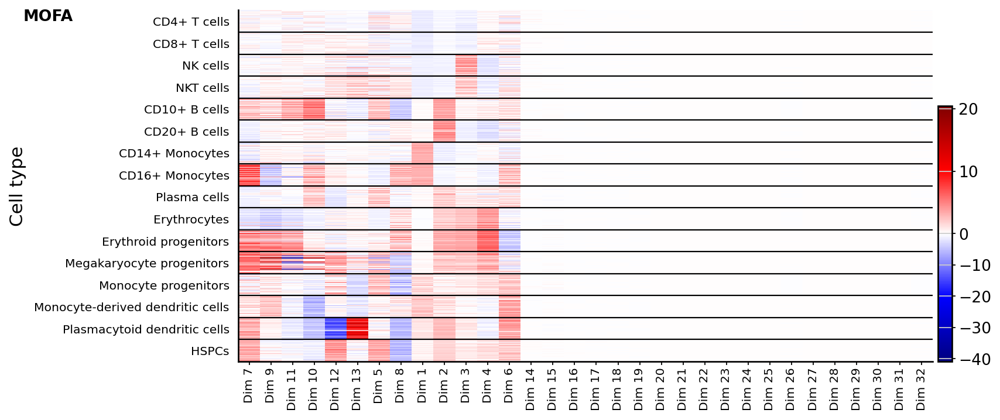

TCVAE-opt


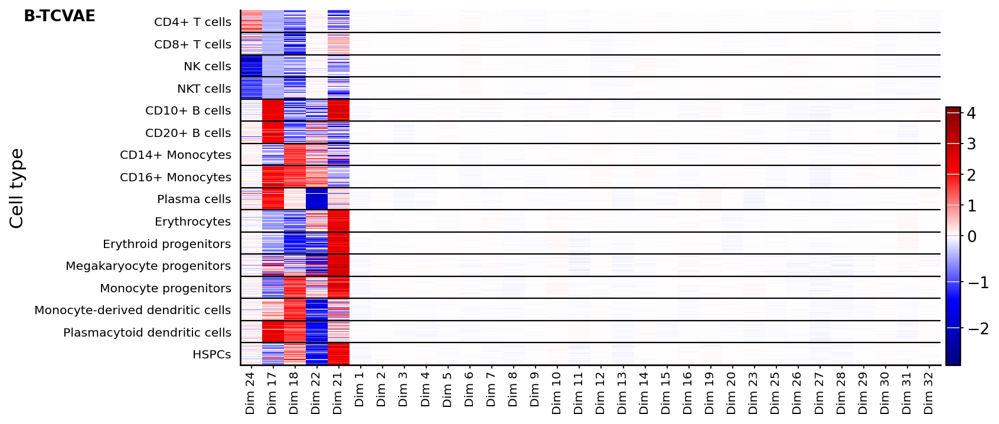

MICHIGAN-opt


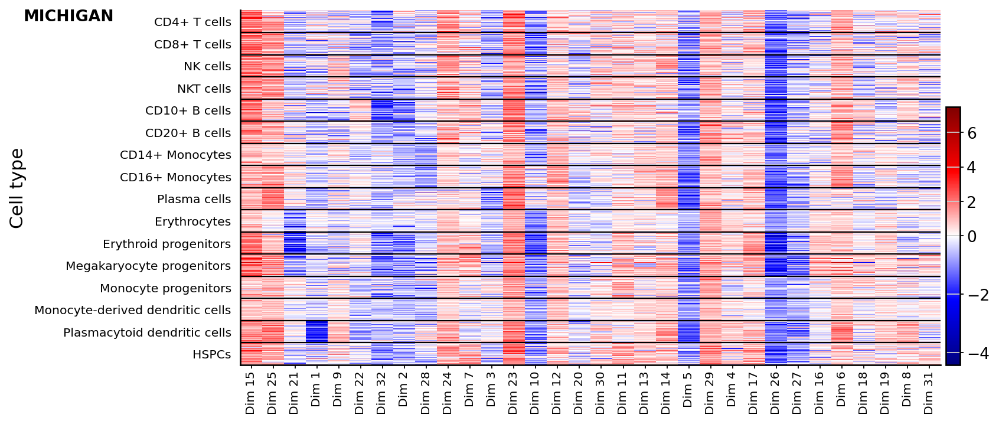

DRVI-CVAE


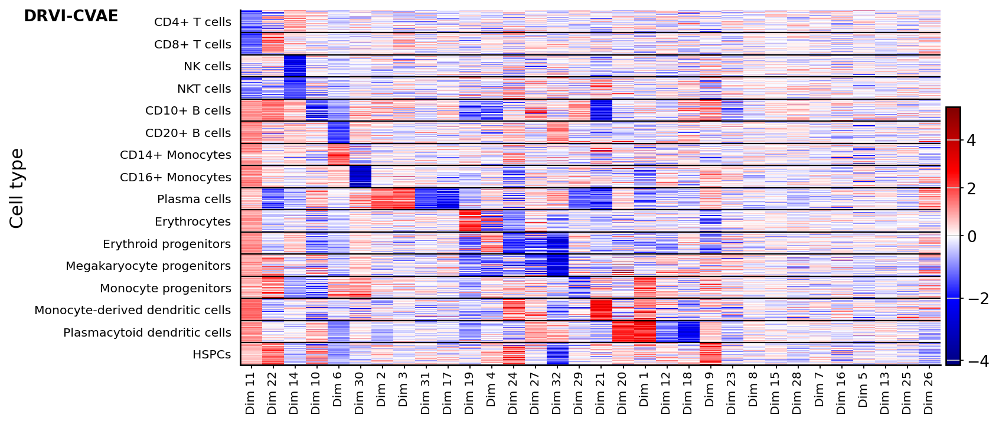

In [20]:
for method_name, embed in embeds.items():
    if method_name not in metric_results:
        continue
    print(method_name)
    k = cell_type_key
    unique_values = list(sorted(list(embed.obs[k].astype(str).unique())))
    method_embed_subset = embed[embed_subset.obs.index].copy()
    method_embed_subset.obs[cell_type_key] = pd.Categorical(method_embed_subset.obs[cell_type_key], unique_plot_cts)
    embed_subset = embed_subset[np.argsort(method_embed_subset.obs[cell_type_key].cat.codes)]
    method_embed_subset.uns[k + "_colors"] = 'black'
    sim_matrix = metric_results[method_name]['Mutual Info Score'][unique_plot_cts].values
    vars = method_embed_subset.var
    vars['van'] = ~ (np.abs(method_embed_subset.X).max(axis=0, keepdims=True) > np.abs(method_embed_subset.X).max() / 5).flatten()
    sim_matrix = (sim_matrix + 0.1) * (~(vars['van'].values[:, np.newaxis]))
    vars['plot_order'] = np.hstack([sim_matrix, sim_matrix * 0.01 + 0.3]).argmax(axis=1).tolist()
    if 'title' not in vars.columns:
        vars['title'] = np.char.add('Dim ', (1 + np.arange(method_embed_subset.n_vars)).astype(str))
        vars['order'] = np.arange(method_embed_subset.n_vars)
    vars['not_interesting'] = np.logical_or(vars['van'], vars['plot_order']==sim_matrix.shape[1])
    vars = pd.concat([vars.query('~not_interesting').sort_values('plot_order'), vars.query('not_interesting').sort_values('order')])
    fig = sc.pl.heatmap(
        method_embed_subset,
        vars['title'],
        k,
        gene_symbols = 'title',
        layer=None,
        # var_group_positions=[(0,30), (31, 51), (52, 63)],
        # var_group_labels=['Cell-type indicator', 'Biological Process', 'Vanished'],
        # var_group_rotation=0,
        figsize=(10, 5),
        show_gene_labels=True,
        dendrogram=False,
        vcenter=0,
        cmap=drvi.utils.pl.cmap.saturated_red_blue_cmap, show=False,
        # swap_axes=True,
    )
    fig['groupby_ax'].set_ylabel('Cell type')
    # fig['groupby_ax'].set_xlabel('')
    fig['groupby_ax'].get_images()[0].remove()
    pos = fig['groupby_ax'].get_position()
    pos.x0 += 0.015
    fig['groupby_ax'].set_position(pos)
    # fig['heatmap_ax'].yaxis.tick_right()
    # cbar = fig['heatmap_ax'].figure.get_axes()[-1]
    # pos = cbar.get_position()
    # # cbar.set_position([1., 0.77, 0.01, 0.13])
    # cbar.set_position([.95, 0.001, 0.01, 0.14])

    ax = fig['heatmap_ax']
    ax.set_ylabel('')
    ax.text(-0.31, 0.97, pretify_method_name(method_name), size=12, ha='left', weight='bold', color='black', rotation=0, transform=ax.transAxes)

    plt.savefig(output_dir / f"ct_vs_dim_heatmap_rotated_{method_name}.pdf", bbox_inches='tight')
    plt.show()

## DRVI

In [21]:
embed_drvi = embeds['DRVI']
model_drvi = drvi.model.DRVI.load(RUNS_TO_LOAD['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')
adata.obsm['X_umap_drvi'] = embed_drvi[adata.obs.index].obsm['X_umap']

INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240430-115959-272081/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      


An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


INFO     DRVI: The model has been initialized                                                                      


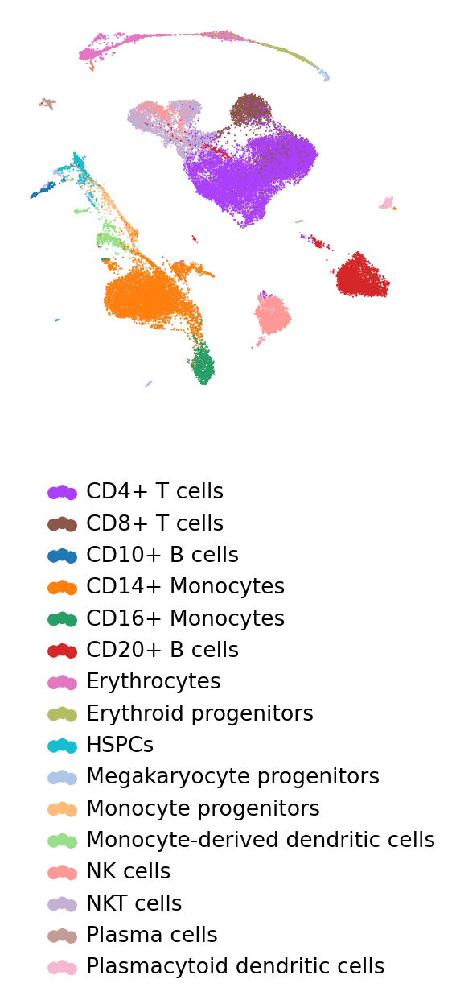

In [22]:
col = cell_type_key
unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
palette = dict(zip(unique_values, cat_20_pallete))
fig = sc.pl.umap(embed_drvi, color=col, 
                 palette = palette, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)


plt.legend(ncol=1, bbox_to_anchor=(1.1, -.15))
fig.savefig(output_dir / f'drvi_umap.pdf', bbox_inches='tight', dpi=300)

# Analysis pipeline

In [23]:
model = model_drvi
embed = embed_drvi

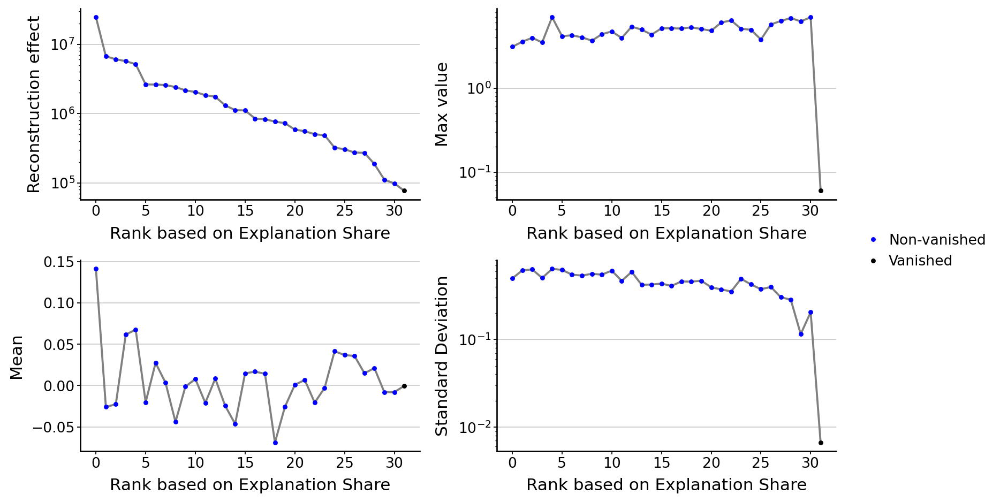

In [24]:
drvi.utils.tl.set_latent_dimension_stats(model, embed)
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2)

In [25]:
filename = RUNS_TO_LOAD['DRVI'] / "traverse_adata.h5ad"
if not (filename).exists():
    traverse_adata = drvi.utils.tl.traverse_latent(model, embed, n_samples=200, max_noise_std=0.2)
    drvi.utils.tl.calculate_differential_vars(traverse_adata)
    traverse_adata.write(filename)
else:
    traverse_adata = sc.read(filename)
traverse_adata

AnnData object with n_obs × n_vars = 128000 × 2000
    obs: 'original_order', 'dim_id', 'sample_id', 'step_id', 'span_value', 'lib_size', 'title', 'vanished', 'order'
    var: 'gene_de_sig', 'mean', 'std', 'original_order'
    uns: 'combined_score_traverse_effect_neg_dim_ids', 'combined_score_traverse_effect_pos_dim_ids', 'combined_score_traverse_effect_stepwise', 'max_possible_traverse_effect_neg_dim_ids', 'max_possible_traverse_effect_pos_dim_ids', 'max_possible_traverse_effect_stepwise', 'min_possible_traverse_effect_neg_dim_ids', 'min_possible_traverse_effect_pos_dim_ids', 'min_possible_traverse_effect_stepwise'
    obsm: 'cat_covs', 'control_latent', 'effect_latent'
    varm: 'combined_score_traverse_effect_neg', 'combined_score_traverse_effect_pos', 'max_possible_traverse_effect_neg', 'max_possible_traverse_effect_pos', 'min_possible_traverse_effect_neg', 'min_possible_traverse_effect_pos'
    layers: 'control', 'effect'

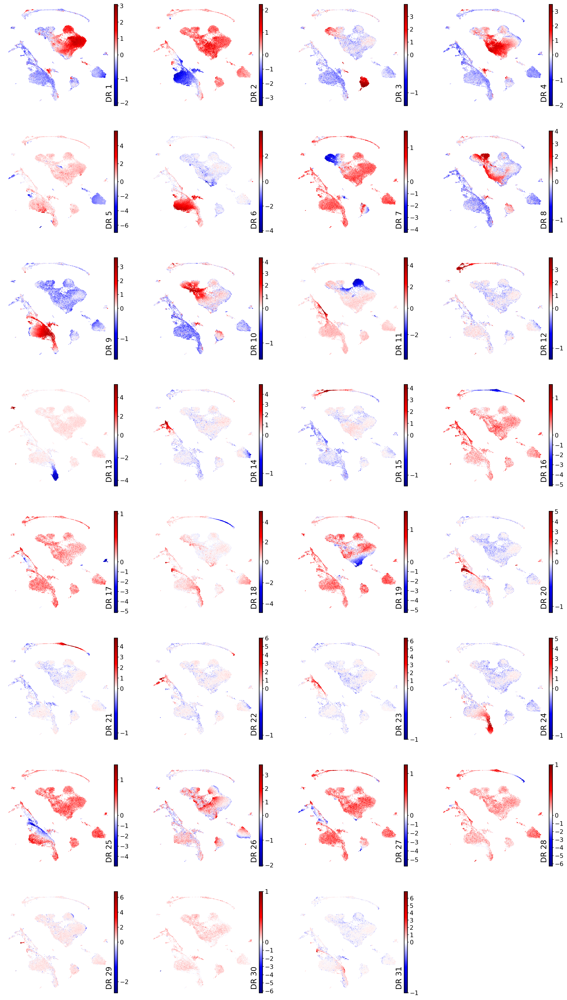

In [26]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=False, show=False)
fig.savefig(output_dir / f'drvi_red_blue_umaps.pdf', bbox_inches='tight', dpi=300)

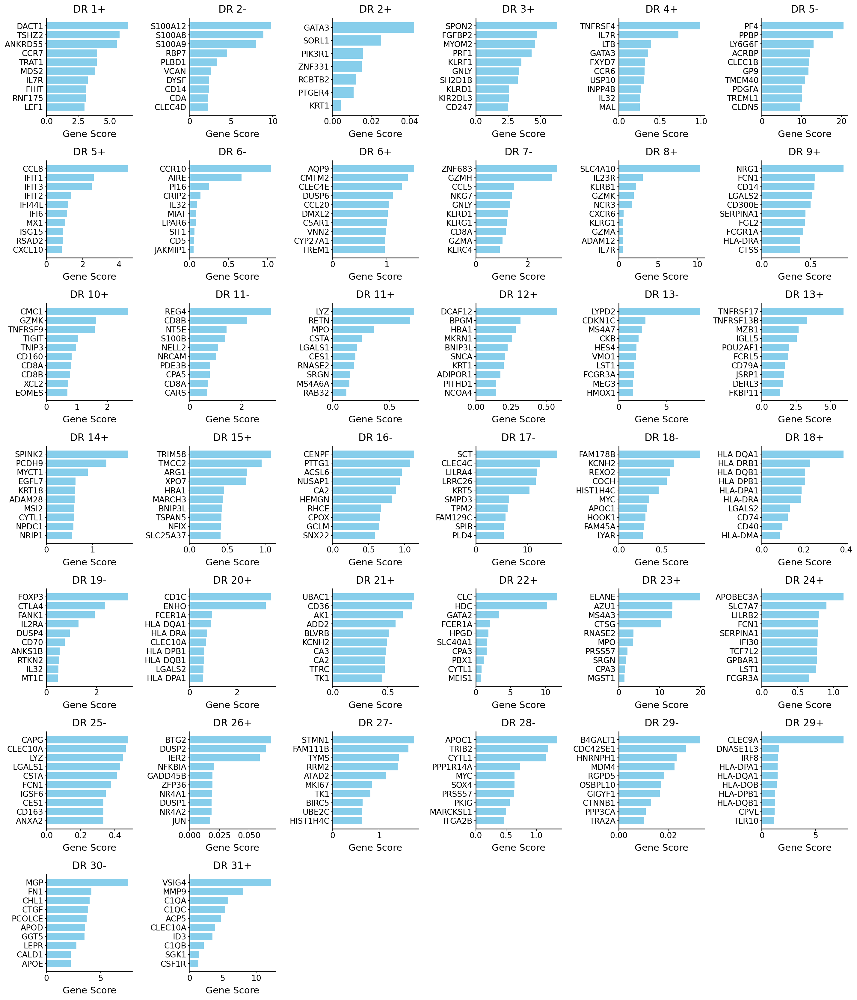

In [27]:
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, show=False, ncols=6,)
fig.savefig(output_dir / f'interpretability_all.pdf', bbox_inches='tight', dpi=300)

## Visualize Example dimensions

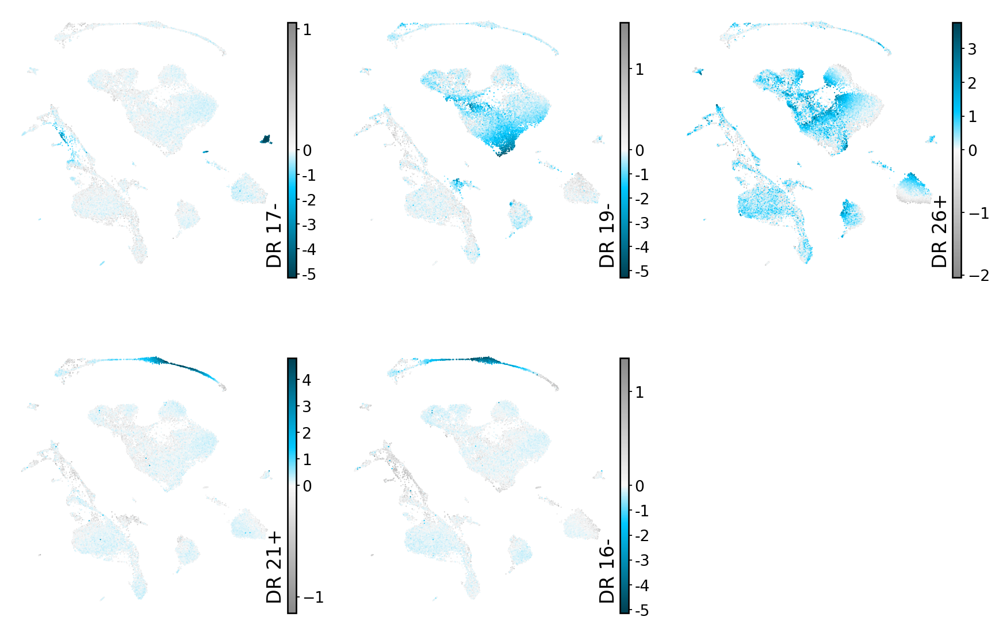

In [28]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=['DR 17-', 'DR 19-', 'DR 26+', 'DR 21+', 'DR 16-'])
fig.savefig(output_dir / f'drvi_interesting_latents_on_umap.pdf', bbox_inches='tight', dpi=300)
plt.show()

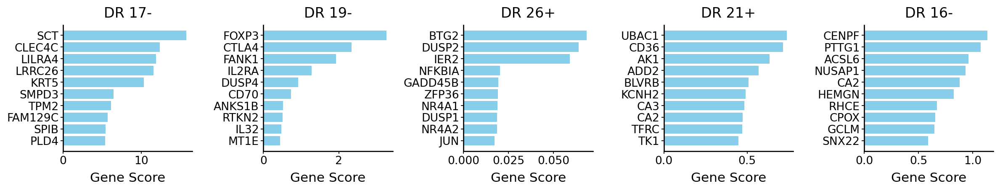

In [29]:
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, show=False,
                                               dim_subset=['DR 17-', 'DR 19-', 'DR 26+', 'DR 21+', 'DR 16-'])
fig.savefig(output_dir / f'drvi_interesting_latents_interpretability.pdf', bbox_inches='tight', dpi=300)
plt.show()

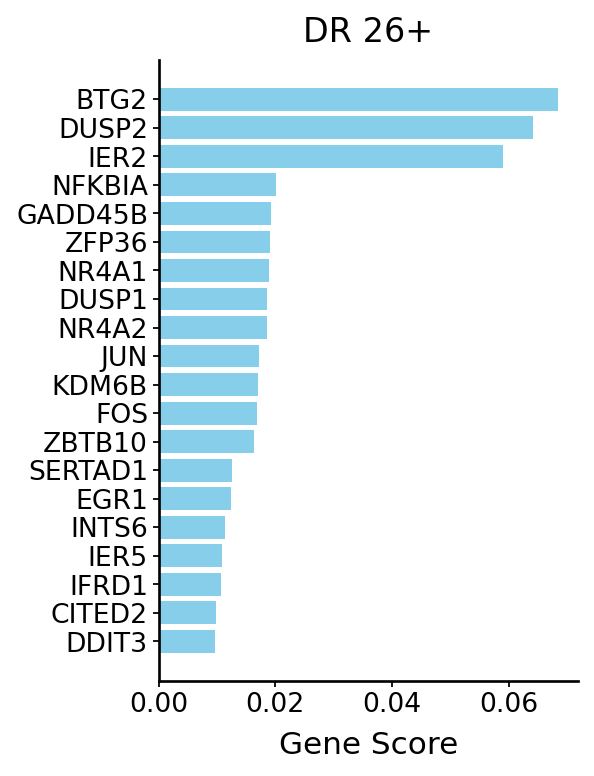

In [30]:
# Rest of the relevant genes for DR 26+ relevant to dissociation stress response
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, n_top_genes=20,
                                               dim_subset=['DR 26+'])

DR 26+


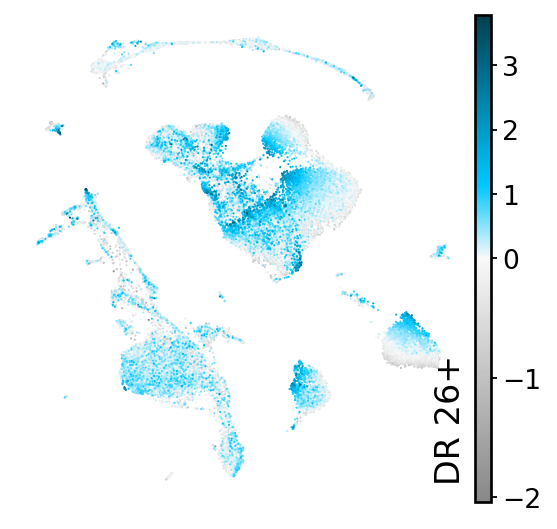

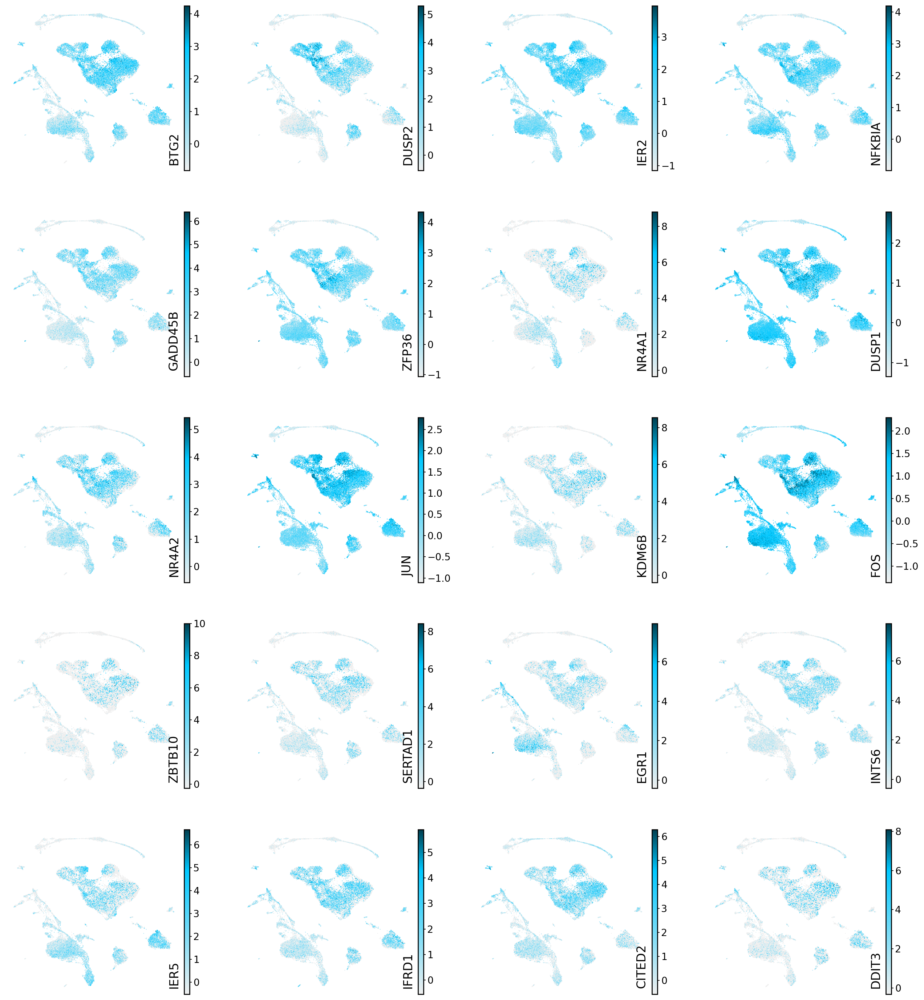

In [31]:
fig = drvi.utils.pl.plot_relevant_genes_on_umap(adata, embed, traverse_adata, "combined_score", score_threshold=0.0, n_top_genes=20,
                                                dim_subset=['DR 26+'])

## Pair plot for lineage example

plotting Dim 12, Dim 5


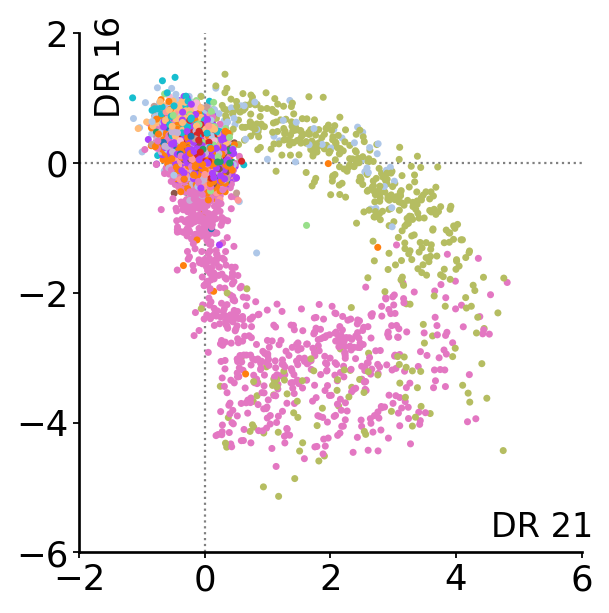

End of latent plots


In [32]:
def save_fn(fig, dim_i, dim_j, original_col):
    dir_name = output_dir
    dir_name.mkdir(parents=True, exist_ok=True)
    fig.savefig(dir_name / f'fig1_joint_plot_{original_col}_{dim_i}_{dim_j}.pdf', bbox_inches='tight', dpi=300)

def pp_fn(g):
    g.ax_marg_x.set_xlim(-2, 6)
    g.ax_marg_y.set_ylim(-6, 2)
    g.ax_marg_x.remove()
    g.ax_marg_y.remove()
    g.ax_joint.get_legend().remove()
    text = g.ax_joint.xaxis.get_label().get_text()
    if text == 'Dim 12':
        text = 'DR 21'
    g.ax_joint.text(0.82, 0.03, text, size=15, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
    text =  g.ax_joint.yaxis.get_label().get_text()
    if text == 'Dim 5':
        text = 'DR 16'
    g.ax_joint.text(0.03, 0.85, text, size=15, ha='left', color='black', rotation=90, transform=g.ax_joint.transAxes)
    plt.xlabel('', axes=g.ax_joint)
    plt.ylabel('', axes=g.ax_joint)

set_font_in_rc_params()
plot_per_latent_scatter(embed, [cell_type_key], col_mapping, xy_limit=5.5, dimensions=[[11, 4]], s=10, alpha=1, plot_height=5.,
                        save_fn=save_fn, pp_fn=pp_fn, zero_lines=True)
plt.rcParams.update(original_params)

# Remove confounding dim

In [33]:
embed = embeds['DRVI']
model = drvi.model.DRVI.load(RUNS_TO_LOAD['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')
drvi.utils.tl.set_latent_dimension_stats(model, embed)

INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240430-115959-272081/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      
INFO     DRVI: The model has been initialized                                                                      


DR 26 is stress response to dissociation

In [34]:
embed_save_address = RUNS_TO_LOAD['DRVI'] / 'embed_without_dissociation_resp_dim.h5ad'

if embed_save_address.exists():
    embed_keep_vars = sc.read_h5ad(embed_save_address)
else:
    embed_keep_vars = embed[:, ~(embed.var['title'].isin(['DR 26']))].copy()

    sc.pp.neighbors(embed_keep_vars, n_neighbors=10, use_rep="X", n_pcs=embed_keep_vars.X.shape[1])
    sc.tl.umap(embed_keep_vars, spread=1.0, min_dist=0.5, random_state=123)
    sc.pp.pca(embed_keep_vars)

    embed_keep_vars.write(embed_save_address)

embed_keep_vars.shape

(32484, 31)

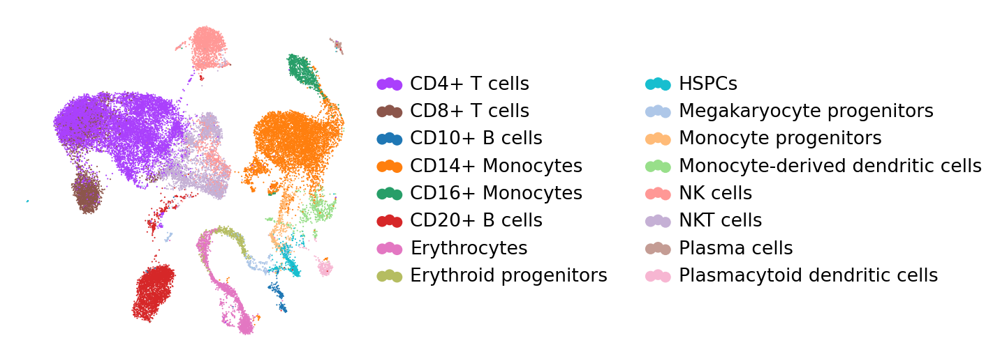

In [35]:
col = cell_type_key
unique_values = list(sorted(list(embed_keep_vars.obs[col].astype(str).unique())))
palette = dict(zip(unique_values, cat_20_pallete))
fig = sc.pl.umap(embed_keep_vars, color=col, 
                 palette = palette, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)
fig.savefig(output_dir / f'drvi_without_dissociation_resp_dim_umap_{col}.pdf', bbox_inches='tight', dpi=300)
plt.show()

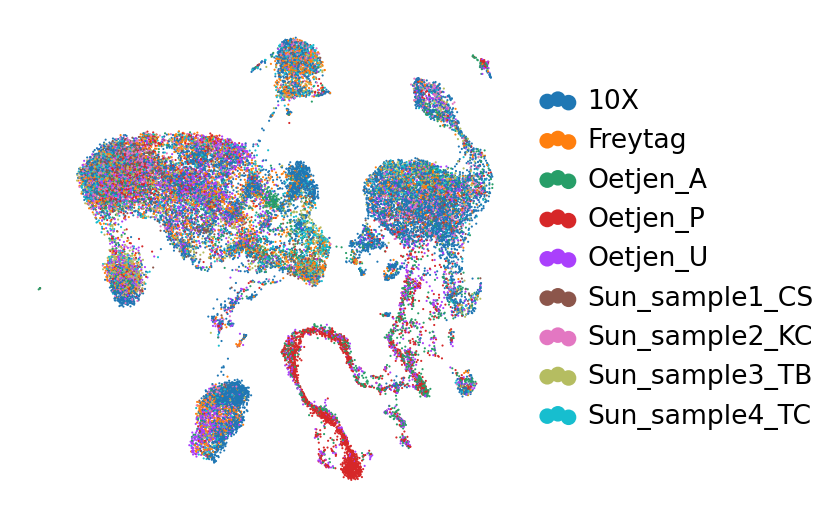

In [36]:
col = condition_key
fig = sc.pl.umap(embed_keep_vars, color=col, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)
fig.savefig(output_dir / f'drvi_without_dissociation_resp_dim_umap_{col}.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [37]:
adata.obsm['DRVI-pruned'] = embed_keep_vars[adata.obs.index].X

                                   DRVI-pruned       Metric Type
isolated_labels                       0.595220  Bio conservation
nmi_ari_cluster_labels_kmeans_nmi     0.699994  Bio conservation
nmi_ari_cluster_labels_kmeans_ari     0.488861  Bio conservation
silhouette_label                      0.612122  Bio conservation
clisi_knn                             1.000000  Bio conservation
silhouette_batch                      0.881011  Batch correction
ilisi_knn                             0.229210  Batch correction
kbet_per_label                        0.345170  Batch correction
graph_connectivity                    0.850918  Batch correction
pcr_comparison                        0.820793  Batch correction


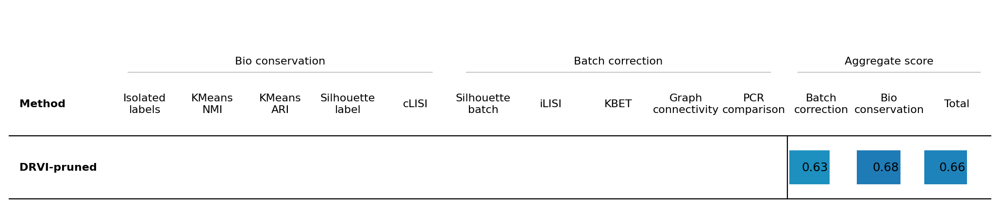

In [38]:
scib_metrics_save_path = RUNS_TO_LOAD['DRVI'] / 'scib_metrics_without_dissociation_resp_dim.csv'
bench = Benchmarker(adata, condition_key, cell_type_key, embedding_obsm_keys=['DRVI-pruned'])
if scib_metrics_save_path.exists():
    bench._results = pd.read_csv(scib_metrics_save_path, index_col=0)
else:
    bench.benchmark()
    bench._results.to_csv(scib_metrics_save_path)

scib_results_drvi_pruned = bench._results
print(scib_results_drvi_pruned)
bench.plot_results_table(min_max_scale=False, show=True)

SCIB for DRVI already calculated.
SCIB for DRVI-IK already calculated.
SCIB for scVI already calculated.
SCIB for PCA already calculated.
SCIB for ICA already calculated.
SCIB for MOFA already calculated.
SCIB for TCVAE-opt already calculated.
SCIB for MICHIGAN-opt already calculated.
SCIB for DRVI-CVAE already calculated.


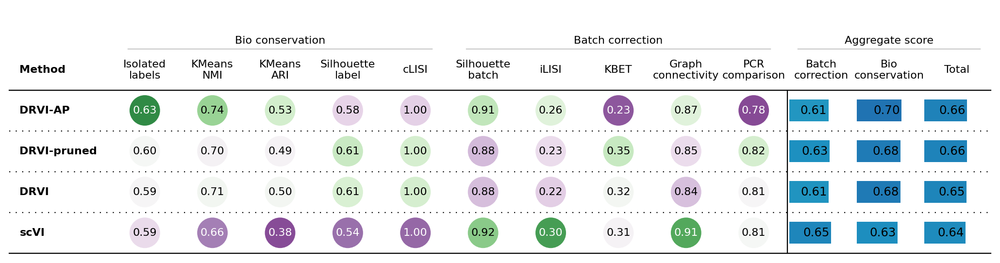

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/plots/immune_analysis/eval_integration_after_pruning_scib.svg')

In [39]:
methods_to_plot = [
    "DRVI-pruned", "DRVI", "DRVI-IK", "scVI", 
]

results = {}
for method_name, run_path in RUNS_TO_LOAD.items():
    if str(run_path).endswith(".h5ad"):
        scib_metrics_save_path = str(run_path)[:-len(".h5ad")] + '_scib_metrics.csv'
    else:
        scib_metrics_save_path = run_path / 'scib_metrics.csv'
    print(f"SCIB for {method_name} already calculated.")
    results[method_name] = pd.read_csv(scib_metrics_save_path, index_col=0)
    results[method_name].columns = [method_name] + list(results[method_name].columns[1:])
results['DRVI-pruned'] = scib_results_drvi_pruned

results_prety = {}
for method_name, result_df in results.items():
    if method_name not in methods_to_plot:
        continue
    assert result_df.columns[0] == method_name
    result_df.rename(columns={method_name: pretify_method_name(method_name)}, inplace=True)
    results_prety[pretify_method_name(method_name)] = result_df

results = results_prety
bench = Benchmarker(adata, condition_key, cell_type_key, embedding_obsm_keys=results.keys())
any_result = results[list(results.keys())[0]]
bench._results = pd.concat([result_df.iloc[:, 0].fillna(0.) for method_name, result_df in results.items()] + [any_result[['Metric Type']]], axis=1, verify_integrity=True)
bench.plot_results_table(min_max_scale=False, show=True, 
                         save_dir=output_dir)
shutil.move(output_dir / 'scib_results.svg', 
            output_dir / f'eval_integration_after_pruning_scib.svg')
